In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
from scipy import stats
import seaborn as sns
import pickle
#sns.set_theme(style="whitegrid")

In [28]:
tsv_file = "/home/elias/EPInformer/data/transcript_SE_f1.psi"
df = pd.read_csv(tsv_file, sep="\t")
df['gene'] = df.index.str.split('.').str[0]

print(df.head())

                                                    K562_TPM  GM12878_TPM  \
ENSG00000000419.12;SE:chr20:50940933-50941129:5...  0.118321     0.029762   
ENSG00000000457.13;SE:chr1:169854964-169855796:...  0.785425     0.670407   
ENSG00000000460.16;SE:chr1:169798958-169800883:...  0.938394     0.819506   
ENSG00000000460.16;SE:chr1:169806088-169807791:...  0.510837     0.757184   
ENSG00000000971.15;SE:chr1:196676065-196677476:...  0.997132          NaN   

                                                               gene  
ENSG00000000419.12;SE:chr20:50940933-50941129:5...  ENSG00000000419  
ENSG00000000457.13;SE:chr1:169854964-169855796:...  ENSG00000000457  
ENSG00000000460.16;SE:chr1:169798958-169800883:...  ENSG00000000460  
ENSG00000000460.16;SE:chr1:169806088-169807791:...  ENSG00000000460  
ENSG00000000971.15;SE:chr1:196676065-196677476:...  ENSG00000000971  


In [29]:
# get percentage of na values in each column
na_percentage = df['K562_TPM'].isna().mean() * 100
print(100 - na_percentage)
na_percentage = df['GM12878_TPM'].isna().mean() * 100
print(100 - na_percentage)

56.90725779528611
58.6031915603926


1875 genes have more than 1 SE event out of 4301 genes


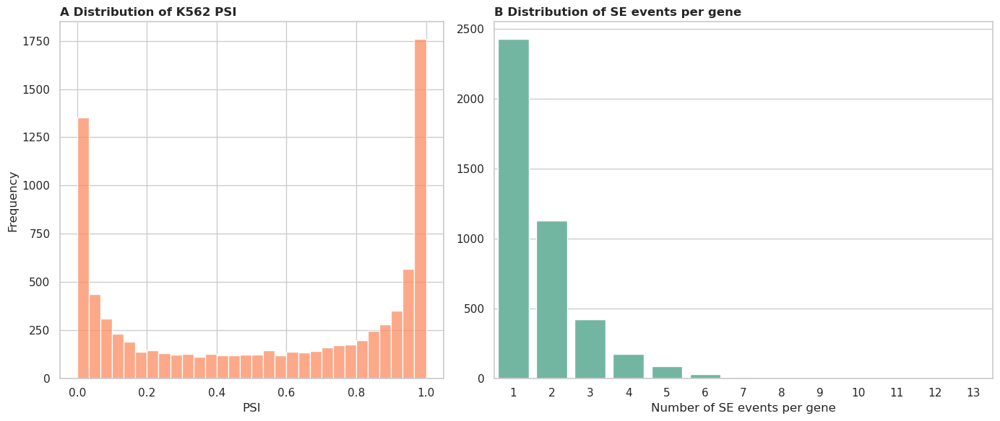

In [30]:
# --- Data prep ---
gene_counts = df.dropna(subset=['K562_TPM', 'GM12878_TPM'])['gene'].value_counts()
num_genes_multi_event = (gene_counts > 1).sum()
print(num_genes_multi_event, "genes have more than 1 SE event out of", gene_counts.shape[0], "genes")

num_rows = df.dropna(subset=['K562_TPM', 'GM12878_TPM']).shape[0]

# --- Figure layout ---
fig, axes = plt.subplots(1, 2, figsize=(14, 6), gridspec_kw={'width_ratios': [1, 1.3]})

# --- Subplot 1: SE events per gene ---
sns.barplot(
    x=gene_counts.value_counts().index,
    y=gene_counts.value_counts().values,
    ax=axes[1],
    color=sns.color_palette("Set2")[0]
)
axes[1].set_xlabel('Number of SE events per gene')
#axes[1].set_ylabel('Frequency')
axes[1].set_title('B Distribution of SE events per gene', fontsize=12, weight="bold", loc='left')

# --- Subplot 2: K562 PSI distribution ---
sns.histplot(
    df['K562_TPM'].dropna(),
    bins=30, kde=False,
    ax=axes[0],
    color=sns.color_palette("Set2")[1]
)
axes[0].set_xlabel('PSI')
axes[0].set_ylabel('Frequency')
axes[0].set_title('A Distribution of K562 PSI', fontsize=12, weight="bold", loc='left')

# --- Final polish ---
plt.tight_layout()
plt.savefig("../images/SE_and_K562_distribution.png")
plt.show()

For each fold, I want to know the ratio between AR and SE events

In [31]:
from glob import glob
fm_path_k562 = "2025-09-29-09-24"

def load_preds(date_folder):
    day_folder = date_folder[:10]  # e.g., '2025-07-25'
    csv_files = [f for f in glob(f"../trained_models/{day_folder}/{date_folder}/*.csv") if not f.endswith('losses.csv')]
    loss_file = [f for f in glob(f"../trained_models/{day_folder}/{date_folder}/*losses.csv")][0]
    losses = pd.read_csv(loss_file)
    if not csv_files:
        raise FileNotFoundError(f"No CSV files found in {date_folder}")
    if len(csv_files) == 1:
        return pd.read_csv(csv_files[0]), losses
    else:
        all_predictions = []
        for pred_file in csv_files:
            df = pd.read_csv(pred_file)
            #if 'Unnamed: 0' in df.columns:
            #    df = df.drop(columns=['Unnamed: 0'])
            all_predictions.append(df)
        return pd.concat(all_predictions, ignore_index=True), losses
    

se_events_raw = pd.read_csv('../data/psi_response.csv')
se_events = se_events_raw[se_events_raw['event_id'].str.contains(';SE:')]
se_genes = set(se_events['gene_id'].unique())

k562_preds, _ = load_preds(fm_path_k562)
k562_preds['SE gene'] = k562_preds['Unnamed: 0'].isin(se_genes)
k562_preds['AR gene'] = ~k562_preds['SE gene']

In [32]:
len(se_genes)

4082

In [33]:
k562_preds.shape

(24938, 9)

In [34]:
# calculate ratio per fold
ratios = []

for fold, group in k562_preds.groupby('fold_idx'):
    print(group[group['SE gene']])
    se_genes = group[group['SE gene']].shape[0]
    ar_genes = group[group['AR gene']].shape[0]
    ratio = se_genes / (se_genes + ar_genes)
    ratios.append({'fold': fold, 'ratio': ratio})
    break

se_events = k562_preds[k562_preds['SE gene']].shape[0]
ar_genes = k562_preds[k562_preds['AR gene']].shape[0]
ratio = se_events / (se_events + ar_genes)
ratios.append({'fold': 'total', 'ratio': ratio})

ratio_df = pd.DataFrame(ratios)

            Unnamed: 0  PredExpr  ActualExpr CellLine   PredPsi  ActualPsi  \
14579  ENSG00000002016  1.193425    1.010724  GM12878  0.666570   1.000000   
14580  ENSG00000002016  0.845432    1.010724  GM12878  0.940715   1.000000   
14581  ENSG00000002016  1.064454    1.010724  GM12878  0.345686   0.208000   
14582  ENSG00000002016  1.300008    1.010724  GM12878  0.736341   0.000000   
14586  ENSG00000003393  1.154896    1.010300  GM12878  0.913427   1.000000   
...                ...       ...         ...      ...       ...        ...   
17650  ENSG00000243943  1.560039    1.828660  GM12878  0.671144   0.013200   
17651  ENSG00000243943  1.558114    1.828660  GM12878  0.624371   0.480080   
17652  ENSG00000243943  1.602821    1.828660  GM12878  0.919566   0.986463   
17663  ENSG00000257218  1.663871    1.438384  GM12878  0.874369   1.000000   
17664  ENSG00000257218  1.559051    1.438384  GM12878  0.286865   0.180688   

       fold_idx  SE gene  AR gene  
14579         1     True   

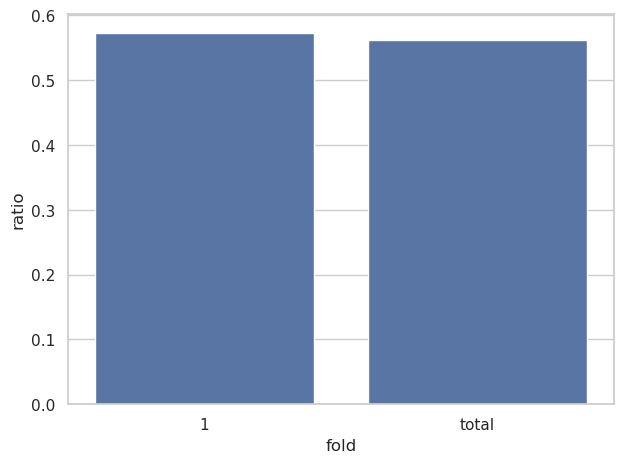

In [35]:
sns.barplot(x='fold', y='ratio', data=ratio_df)
plt.tight_layout()
plt.show()

In [36]:
with open('../split_idx.pkl', 'rb') as f:
    splits = pickle.load(f)

split_df = pd.DataFrame(splits)
split_df

,1,2,3,4,5,6,7,8,9,10,11,12
train,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 17, 18, 19, 20, 21...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[0, 1, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, ...","[0, 1, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, ...","[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 1...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 17, 18, 19, 20, 21..."
valid,"[9, 10, 11, 12, 13, 14, 15, 16, 23, 24, 25, 26...","[43, 44, 45, 46, 60, 61, 62, 65, 66, 67, 68, 6...","[75, 76, 99, 100, 101, 102, 103, 104, 116, 117...","[48, 49, 50, 92, 93, 134, 226, 415, 416, 502, ...","[283, 284, 285, 286, 613, 614, 615, 616, 652, ...","[17, 18, 19, 20, 21, 22, 64, 113, 114, 115, 14...","[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 5...","[385, 386, 387, 396, 397, 398, 399, 575, 627, ...","[109, 110, 111, 112, 125, 126, 127, 128, 152, ...","[2, 3, 4, 5, 6, 7, 8, 581, 582, 636, 643, 644,...","[75, 76, 99, 100, 101, 102, 103, 104, 116, 117...","[65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 167, ..."
test,"[43, 44, 45, 46, 60, 61, 62, 65, 66, 67, 68, 6...","[75, 76, 99, 100, 101, 102, 103, 104, 116, 117...","[48, 49, 50, 92, 93, 134, 226, 415, 416, 502, ...","[283, 284, 285, 286, 613, 614, 615, 616, 652, ...","[17, 18, 19, 20, 21, 22, 64, 113, 114, 115, 14...","[32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 5...","[385, 386, 387, 396, 397, 398, 399, 575, 627, ...","[109, 110, 111, 112, 125, 126, 127, 128, 152, ...","[2, 3, 4, 5, 6, 7, 8, 581, 582, 636, 643, 644,...","[47, 184, 185, 186, 187, 188, 189, 190, 534, 5...","[0, 1, 28, 29, 30, 31, 51, 52, 63, 123, 132, 1...","[9, 10, 11, 12, 13, 14, 15, 16, 23, 24, 25, 26..."
train_ids,[ENSG00000000003;AR:chrX:100633539-100633931:1...,[ENSG00000000003;AR:chrX:100633539-100633931:1...,[ENSG00000000003;AR:chrX:100633539-100633931:1...,[ENSG00000000003;AR:chrX:100633539-100633931:1...,[ENSG00000000003;AR:chrX:100633539-100633931:1...,[ENSG00000000003;AR:chrX:100633539-100633931:1...,[ENSG00000000003;AR:chrX:100633539-100633931:1...,[ENSG00000000003;AR:chrX:100633539-100633931:1...,[ENSG00000000003;AR:chrX:100633539-100633931:1...,[ENSG00000000003;AR:chrX:100633539-100633931:1...,[ENSG00000000419;AR:chr20:50936262-50940865:50...,[ENSG00000000003;AR:chrX:100633539-100633931:1...
test_ids,[ENSG00000002016;AR:chr12:916820-925450:925525...,[ENSG00000003756;AR:chr3:50106864-50107482:501...,[ENSG00000002549;AR:chr4:17598558-17604588:176...,[ENSG00000006837;AR:chr5:134302687-134304405:1...,[ENSG00000001036;AR:chr6:143495847-143497389:1...,[ENSG00000001629;AR:chr7:92387884-92387975:923...,[ENSG00000008513;AR:chr8:133464957-133465894:1...,[ENSG00000004776;AR:chr19:35755683-35755772:35...,[ENSG00000000419;AR:chr20:50936262-50940865:50...,[ENSG00000002330;AR:chr11:64270337-64271613:64...,[ENSG00000000003;AR:chrX:100633539-100633931:1...,[ENSG00000000457;AR:chr1:169853772-169854270:1...


In [37]:
# check out the test chromosomes per fold
fold_chroms = {}
for fold in splits.keys():
    fold_chroms[fold] = set()
    for sample in splits[fold]["test_ids"]:
        chrom = sample.split(":")[1]
        fold_chroms[fold].add(chrom)

print(fold_chroms)

{1: {'chr12', 'chr2'}, 2: {'chr3', 'chr13'}, 3: {'chr14', 'chr4'}, 4: {'chr15', 'chr5'}, 5: {'chr16', 'chr6'}, 6: {'chr17', 'chr7'}, 7: {'chr18', 'chr8'}, 8: {'chr9', 'chr19'}, 9: {'chr10', 'chr20'}, 10: {'chr21', 'chr11'}, 11: {'chrX', 'chr22'}, 12: {'chr3', 'chr1'}}


In [38]:
fold_ratios = []

for fold in splits.keys():
    ar_samples = [x for x in splits[fold]['train_ids'] if 'AR' in x]
    se_samples = [x for x in splits[fold]['train_ids'] if 'SE' in x]
    size_ar = len(ar_samples)
    size_se = len(se_samples)

    ratio_fold = size_se / (size_se + size_ar)
    fold_ratios.append({'fold': fold, 'ratio': ratio_fold})

fold_ratio_df = pd.DataFrame(fold_ratios)

In [39]:
fold_ratio_df

,fold,ratio
0,1,0.287040
1,2,0.283005
2,3,0.282503
3,4,0.282075
4,5,0.287427
5,6,0.288539
6,7,0.285864
7,8,0.292009
8,9,0.294514
9,10,0.287871


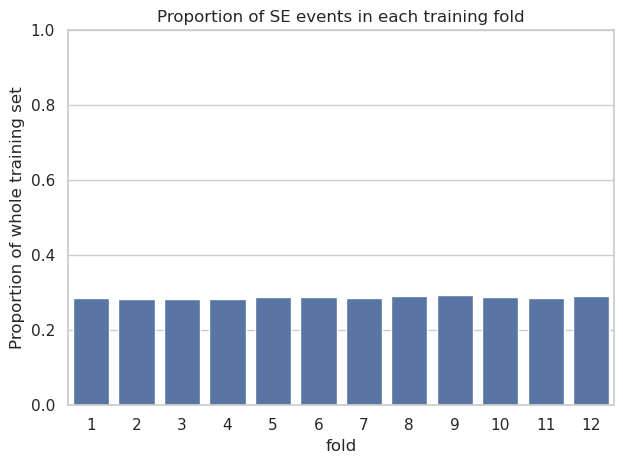

In [40]:
sns.barplot(x='fold', y='ratio', data=fold_ratio_df)
plt.ylim(0,1)
plt.ylabel("Proportion of whole training set")
plt.title("Proportion of SE events in each training fold")
plt.tight_layout()
plt.show()

In [6]:
original_predictions = pd.read_csv("../data/predictions_epinformer.csv")
original_predictions.rename(columns={'Unnamed: 0': 'gene_id', 'Pred': 'PredExpr', 'actual': 'ActualExpr'}, inplace=True)
original_predictions

,gene_id,PredExpr,ActualExpr,fold_idx
0,ENSG00000002016,0.520294,0.408407,1
1,ENSG00000003056,1.238305,1.271484,1
2,ENSG00000003137,-1.140359,-1.146680,1
3,ENSG00000003393,0.701360,0.515775,1
4,ENSG00000003400,0.612615,0.701112,1
...,...,...,...,...
18372,ENSG00000255835,1.375354,1.462723,12
18373,ENSG00000256374,-1.124181,-0.850001,12
18374,ENSG00000257315,0.828543,1.029436,12
18375,ENSG00000258465,0.905968,1.491574,12


In [7]:
se_events = pd.read_csv('../data/psi_response.csv')
all_ev_genes = set(se_events['gene_id'].unique())
se_events = se_events[se_events['event_id'].str.contains(';SE:')]
se_genes = set(se_events['gene_id'].unique())

orig_pred_filtered = original_predictions[original_predictions['gene_id'].isin(all_ev_genes)].copy()

orig_pred_filtered['SE gene'] = orig_pred_filtered['gene_id'].isin(se_genes)
orig_pred_filtered['AR gene'] = ~orig_pred_filtered['SE gene']

In [ ]:
f1_preds = orig_pred_filtered[orig_pred_filtered['fold_idx'] == 1]
f1_preds = f1_preds.sample(frac=1, random_state=42)

,gene_id,PredExpr,ActualExpr,fold_idx,SE gene,AR gene
2057,ENSG00000205795,-0.647374,-1.127835,1,False,True
1098,ENSG00000139629,0.420330,0.403998,1,True,False
2173,ENSG00000257921,0.381009,0.808262,1,False,True
1108,ENSG00000139714,-0.658996,-0.746628,1,False,True
960,ENSG00000138002,0.924372,0.464258,1,True,False
...,...,...,...,...,...,...
1623,ENSG00000171840,0.750403,-0.021864,1,False,True
1722,ENSG00000176871,0.832011,1.263948,1,False,True
1816,ENSG00000182993,0.504139,-0.263615,1,False,True
1266,ENSG00000152102,1.281958,1.247883,1,False,True


<Figure size 600x600 with 0 Axes>

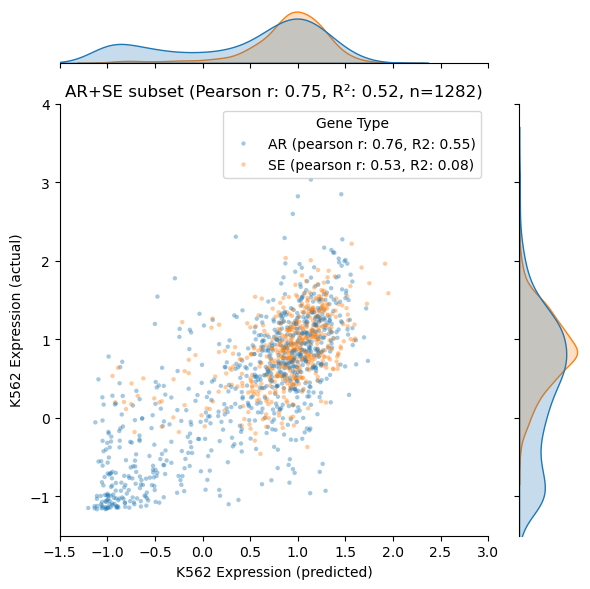

In [10]:

cell_line = "K562"
se_preds = f1_preds[f1_preds['SE gene'] == True]
ar_preds = f1_preds[f1_preds['SE gene'] == False]
pearsonr_all, _ = stats.pearsonr(f1_preds['PredExpr'], f1_preds['ActualExpr'])
r2_all = r2_score(f1_preds['ActualExpr'], f1_preds['PredExpr'])
pearsonR_se, _ = stats.pearsonr(se_preds['PredExpr'], se_preds['ActualExpr'])
pearsonR_ar, _ = stats.pearsonr(ar_preds['PredExpr'], ar_preds['ActualExpr'])
r2_se = r2_score(se_preds['ActualExpr'], se_preds['PredExpr'])
r2_ar = r2_score(ar_preds['ActualExpr'], ar_preds['PredExpr'])
prediction_task = 'Expression'

f1_preds['Gene Type'] = f1_preds['SE gene'].replace({True: f'SE (pearson r: {pearsonR_se:.2f}, R2: {r2_se:.2f})', False: f'AR (pearson r: {pearsonR_ar:.2f}, R2: {r2_ar:.2f})'})

plt.figure(figsize=(6,6))
ax = sns.jointplot(
    data=f1_preds,
    x='PredExpr',
    y='ActualExpr',
    hue='Gene Type',
    kind = 'scatter',
    joint_kws={'marker':'o', 's':10, 'alpha':0.4, 'linewidth':0},
)

plt.title(f"AR+SE subset (Pearson r: {pearsonr_all:.2f}, R²: {r2_all:.2f}, n={len(f1_preds)})")
plt.ylabel(f'{cell_line} {prediction_task} (actual)')
plt.xlabel(f'{cell_line} {prediction_task} (predicted)')
plt.ylim(-1.5,4)
plt.xlim(-1.5,3)
plt.tight_layout()
plt.show()